
# <center> XAI (Explainable AI)</center>

<p> Build a TreeExplainer and compute Shaplay Values </p>
<p> ● Visualize explanations for a specific point of your data set, </p>
<p> ● Visualize explanations for all points of your data set at once, </p>
<p> ● Visualize a summary plot for each class on the whole dataset. </p>

In [1]:
import pandas as pd
# ColumnTransformer was introduced in 0.20 so make sure you have this version
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Algorithms, from the easiest to the hardest to intepret.
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost.sklearn import XGBClassifier

### The Dataset

In [123]:
train = pd.read_csv("../data/raw/application_train.csv").set_index("SK_ID_CURR")
test = pd.read_csv("../data/raw/application_test.csv").set_index("SK_ID_CURR")

X = train.drop('TARGET',axis=1)#pd.concat([train, test], ignore_index=True).drop("TARGET", axis=1)
y = train.TARGET

In [122]:
test

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,Unaccompanied,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,Unaccompanied,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0


In [65]:
# Some such as default would be binary features, but since
# they have a third class "unknown" we'll process them as non binary categorical
num_features = ["CNT_CHILDREN",	"AMT_INCOME_TOTAL",	"AMT_CREDIT",	"AMT_ANNUITY",	"AMT_GOODS_PRICE", "REGION_POPULATION_RELATIVE",	"DAYS_BIRTH",	"DAYS_EMPLOYED",
	"DAYS_REGISTRATION",	"DAYS_ID_PUBLISH",	"OWN_CAR_AGE",	"FLAG_MOBIL",	"FLAG_EMP_PHONE",	"FLAG_WORK_PHONE",	"FLAG_CONT_MOBILE",	"FLAG_PHONE",	"FLAG_EMAIL",
    "CNT_FAM_MEMBERS",	"REGION_RATING_CLIENT",	"REGION_RATING_CLIENT_W_CITY", "HOUR_APPR_PROCESS_START",	"REG_REGION_NOT_LIVE_REGION",	"REG_REGION_NOT_WORK_REGION",	
    "LIVE_REGION_NOT_WORK_REGION",	"REG_CITY_NOT_LIVE_CITY","REG_CITY_NOT_WORK_CITY",	"LIVE_CITY_NOT_WORK_CITY",
    "EXT_SOURCE_1",	"EXT_SOURCE_2",	"EXT_SOURCE_3",	"APARTMENTS_AVG",	"BASEMENTAREA_AVG",	"YEARS_BEGINEXPLUATATION_AVG",	"YEARS_BUILD_AVG",	
    "COMMONAREA_AVG",	"ELEVATORS_AVG",	"ENTRANCES_AVG",	"FLOORSMAX_AVG",	"FLOORSMIN_AVG",	"LANDAREA_AVG",	"LIVINGAPARTMENTS_AVG",	
    "LIVINGAREA_AVG",	"NONLIVINGAPARTMENTS_AVG",	"NONLIVINGAREA_AVG",	"APARTMENTS_MODE",	"BASEMENTAREA_MODE",	"YEARS_BEGINEXPLUATATION_MODE",	
    "YEARS_BUILD_MODE",	"COMMONAREA_MODE",	"ELEVATORS_MODE",	"ENTRANCES_MODE",	"FLOORSMAX_MODE",	"FLOORSMIN_MODE",	"LANDAREA_MODE",	
    "LIVINGAPARTMENTS_MODE",	"LIVINGAREA_MODE",	"NONLIVINGAPARTMENTS_MODE",	"NONLIVINGAREA_MODE",	"APARTMENTS_MEDI",	"BASEMENTAREA_MEDI",	
    "YEARS_BEGINEXPLUATATION_MEDI",	"YEARS_BUILD_MEDI",	"COMMONAREA_MEDI",
    "ELEVATORS_MEDI",	"ENTRANCES_MEDI",	"FLOORSMAX_MEDI",	"FLOORSMIN_MEDI",	"LANDAREA_MEDI",
    "LIVINGAPARTMENTS_MEDI",	"LIVINGAREA_MEDI",	"NONLIVINGAPARTMENTS_MEDI",	"NONLIVINGAREA_MEDI", "TOTALAREA_MODE",
    "OBS_30_CNT_SOCIAL_CIRCLE",	"DEF_30_CNT_SOCIAL_CIRCLE",	"OBS_60_CNT_SOCIAL_CIRCLE",	"DEF_60_CNT_SOCIAL_CIRCLE",	
    "DAYS_LAST_PHONE_CHANGE",	"FLAG_DOCUMENT_2",	"FLAG_DOCUMENT_3",	"FLAG_DOCUMENT_4",	"FLAG_DOCUMENT_5",	"FLAG_DOCUMENT_6",	
    "FLAG_DOCUMENT_7",	"FLAG_DOCUMENT_8",	"FLAG_DOCUMENT_9",	"FLAG_DOCUMENT_10",	"FLAG_DOCUMENT_11",	"FLAG_DOCUMENT_12",	
    "FLAG_DOCUMENT_13",	"FLAG_DOCUMENT_14",	"FLAG_DOCUMENT_15",	"FLAG_DOCUMENT_16",	"FLAG_DOCUMENT_17",	"FLAG_DOCUMENT_18",
    "FLAG_DOCUMENT_19",	"FLAG_DOCUMENT_20",	"FLAG_DOCUMENT_21",	"AMT_REQ_CREDIT_BUREAU_HOUR",	"AMT_REQ_CREDIT_BUREAU_DAY",
    "AMT_REQ_CREDIT_BUREAU_WEEK",	"AMT_REQ_CREDIT_BUREAU_MON",	"AMT_REQ_CREDIT_BUREAU_QRT",	"AMT_REQ_CREDIT_BUREAU_YEAR"	
	]

cat_features = ["NAME_CONTRACT_TYPE","CODE_GENDER", "NAME_TYPE_SUITE","NAME_INCOME_TYPE",
                    "NAME_EDUCATION_TYPE","NAME_FAMILY_STATUS","NAME_HOUSING_TYPE", "OCCUPATION_TYPE", 
                    "WEEKDAY_APPR_PROCESS_START","ORGANIZATION_TYPE", "FONDKAPREMONT_MODE", "HOUSETYPE_MODE",
                    "WALLSMATERIAL_MODE", "FLAG_OWN_CAR", "FLAG_OWN_REALTY", "EMERGENCYSTATE_MODE"]

1. We'll define a new `ColumnTransformer` object (new in sklearn 0.20) that keeps our numerical features and apply one hot encoding on our categorical features. That will allow us to create a clean pipeline that includes both features engineering (one hot encoding here) and training the model (a nice way to avoid data leakage)

In [66]:
import sys
new_path = '../src/features'

if new_path not in sys.path:
    sys.path.append(new_path)
#import build_features
#preprocessor = build_features.data_prep(train,cat_features)

Process Nan...
TARGET - 0%
CNT_CHILDREN - 0%
AMT_INCOME_TOTAL - 0%
AMT_CREDIT - 0%
AMT_ANNUITY - 0%
AMT_GOODS_PRICE - 0%
REGION_POPULATION_RELATIVE - 0%
DAYS_BIRTH - 0%
DAYS_EMPLOYED - 0%
DAYS_REGISTRATION - 0%
DAYS_ID_PUBLISH - 0%
OWN_CAR_AGE - 66%
FLAG_MOBIL - 0%
FLAG_EMP_PHONE - 0%
FLAG_WORK_PHONE - 0%
FLAG_CONT_MOBILE - 0%
FLAG_PHONE - 0%
FLAG_EMAIL - 0%
CNT_FAM_MEMBERS - 0%
REGION_RATING_CLIENT - 0%
REGION_RATING_CLIENT_W_CITY - 0%
HOUR_APPR_PROCESS_START - 0%
REG_REGION_NOT_LIVE_REGION - 0%
REG_REGION_NOT_WORK_REGION - 0%
LIVE_REGION_NOT_WORK_REGION - 0%
REG_CITY_NOT_LIVE_CITY - 0%
REG_CITY_NOT_WORK_CITY - 0%
LIVE_CITY_NOT_WORK_CITY - 0%
EXT_SOURCE_1 - 56%
EXT_SOURCE_2 - 0%
EXT_SOURCE_3 - 20%
APARTMENTS_AVG - 51%
BASEMENTAREA_AVG - 59%
YEARS_BEGINEXPLUATATION_AVG - 49%
YEARS_BUILD_AVG - 66%
COMMONAREA_AVG - 70%
ELEVATORS_AVG - 53%
ENTRANCES_AVG - 50%
FLOORSMAX_AVG - 50%
FLOORSMIN_AVG - 68%
LANDAREA_AVG - 59%
LIVINGAPARTMENTS_AVG - 68%
LIVINGAREA_AVG - 50%
NONLIVINGAPARTMENTS_AVG 

In [167]:
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

categorical_transformer = Pipeline(
    [
        ('imputer_cat', SimpleImputer(strategy = 'constant',
          fill_value = 'missing')),
        ('onehot', OneHotEncoder(handle_unknown = 'ignore'))
    ]
)

numeric_transformer = Pipeline(
    [
        ('imputer_num', SimpleImputer(strategy = 'median')),
        ('scaler', StandardScaler())
    ]
)

preprocessor = ColumnTransformer(
    [
        ('categoricals', categorical_transformer, 
          cat_features),
        ('numericals', numeric_transformer, num_features)
    ],
    remainder = 'drop'
)

lr_model = Pipeline(
    [
        ('preprocessing', preprocessor),
        ('clf', LogisticRegression(class_weight="balanced", solver="liblinear", random_state=42))
    ]
)


dt_model = Pipeline(
    [
        ('preprocessing', preprocessor),
        ('clf', DecisionTreeClassifier(class_weight="balanced"))
    ]
)

# Random Forest
rf_model = Pipeline(
    [
        ('preprocessing', preprocessor),
        ('clf', RandomForestClassifier(class_weight="balanced", n_estimators=100, n_jobs=-1))
    ]
)

# XGBoost
xgb_model = Pipeline(
    [
        ('preprocessing', preprocessor),
        ('clf', XGBClassifier(scale_pos_weight=(1 - y.mean()), n_jobs=-1))
    ]
)

Now we can define our 4 models as sklearn `Pipeline` object, containing our preprocessing step and training of one given algorithm.

In [68]:
X_train, X_test = train.iloc[:, 1:240], test.iloc[:, 1:240]
y_train, y_test = train.TARGET, train.TARGET

In [110]:
lr_model.fit(X_train,y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('categoricals',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'HOUR_APPR_PROCESS_START',
                                                   'REG_REGION_NOT_LIVE_REGION',
                                                   'REG_REGION_NOT_WORK_REGION',
                                                   'LIVE_REGION_NOT_WORK_REGION',
                                                   'REG_CITY_NOT_LIVE_CITY',
                                                   'REG_CITY_NOT_WORK_CITY',
                                                   'LIVE_CITY_NOT_WORK_CITY',
                                                   'EXT_SOURCE_1',
                                                   'EXT_SOURCE_2',
                                                   'EXT_SOURCE_3', ...])])),
                ('clf',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

## Intepret "white box" models

In [93]:
gs = GridSearchCV(lr_model, {"clf__C": [1, 1.3, 1.5]}, n_jobs=-1, cv=5, scoring="accuracy")
gs.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('categoricals',
                                                                         Pipeline(steps=[('imputer_cat',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'NAME_TYPE_SUITE',
                                                                          'NAME_INCOME_TYPE',
                                                                          'NAME_EDUCATION_TYPE',
                                                                          'NAME_...
                                                                          'REG_REGION_NOT_LIVE_REGION',
                                                                          'REG_REGION_NOT_WORK_REGION',
                                                                          'LIVE_REGION_NOT_WORK_REGION',
                                                                          'REG_CITY_NOT_LIVE_CITY',
                                                                          'REG_CITY_NOT_WORK_CITY',
                                                                          'LIVE_CITY_NOT_WORK_CITY',
                                                                          'EXT_SOURCE_1',
                                                                          'EXT_SOURCE_2',
                                                                          'EXT_SOURCE_3', ...])])),
                                       ('clf',
                                        LogisticRegression(class_weight='balanced',
                                                           random_state=42,
                                                           solver='liblinear'))]),
             n_jobs=-1, param_grid={'clf__C': [1, 1.3, 1.5]},
             scoring='accuracy')

Best parameters and score

In [94]:
print(gs.best_params_)
print(gs.best_score_)

{'clf__C': 1}
0.6883786231061203


In [95]:
lr_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('categoricals',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'HOUR_APPR_PROCESS_START',
                                                   'REG_REGION_NOT_LIVE_REGION',
                                                   'REG_REGION_NOT_WORK_REGION',
                                                   'LIVE_REGION_NOT_WORK_REGION',
                                                   'REG_CITY_NOT_LIVE_CITY',
                                                   'REG_CITY_NOT_WORK_CITY',
                                                   'LIVE_CITY_NOT_WORK_CITY',
                                                   'EXT_SOURCE_1',
                                                   'EXT_SOURCE_2',
                                                   'EXT_SOURCE_3', ...])])),
                ('clf',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

In [171]:
lr_model.get_params("clf")

{'memory': None,
 'steps': [('preprocessing',
   ColumnTransformer(transformers=[('categoricals',
                                    Pipeline(steps=[('imputer_cat',
                                                     SimpleImputer(fill_value='missing',
                                                                   strategy='constant')),
                                                    ('onehot',
                                                     OneHotEncoder(handle_unknown='ignore'))]),
                                    ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
                                     'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE',
                                     'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
                                     'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
                                     'WEEKDAY...
                                     'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
                                     'FLAG_PHONE', 'FLAG_EMAIL

Now we can fit the model on the whole training set and calculate accuracy on the test set.

In [96]:
lr_model.fit(X_train, y_train)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('categoricals',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'HOUR_APPR_PROCESS_START',
                                                   'REG_REGION_NOT_LIVE_REGION',
                                                   'REG_REGION_NOT_WORK_REGION',
                                                   'LIVE_REGION_NOT_WORK_REGION',
                                                   'REG_CITY_NOT_LIVE_CITY',
                                                   'REG_CITY_NOT_WORK_CITY',
                                                   'LIVE_CITY_NOT_WORK_CITY',
                                                   'EXT_SOURCE_1',
                                                   'EXT_SOURCE_2',
                                                   'EXT_SOURCE_3', ...])])),
                ('clf',
                 LogisticRegression(C=1, class_weight='balanced',
                                    random_state=42, solver='liblinear'))])

Generate predictions

In [124]:
y_pred = lr_model.predict(X)

In [125]:
accuracy_score(y, y_pred)

0.6888826741157227

In [131]:
print(classification_report(y, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.69      0.80    282686
           1       0.16      0.68      0.26     24825

    accuracy                           0.69    307511
   macro avg       0.56      0.68      0.53    307511
weighted avg       0.90      0.69      0.76    307511



#### Visualise the weights associated to each feature of the logistic regression model

In [136]:
import eli5
eli5.show_weights(lr_model
   .named_steps['preprocessing'].transformers_[1][1]\
   .named_steps['onehot'].get_feature_names(cat_features))

"""clf.named_steps['preprocessor'].transformers_[1][1]\
   .named_steps['onehot'].get_feature_names(categorical_features)"""

KeyError: 'onehot'

In [150]:
lr_model['preprocessing'].transformers_[1][1]\
    ['onehot'].get_feature_names(cat_features)

KeyError: 'onehot'

That gives us the weights associated to each feature, that can be seen as the contribution of each feature into predicting that the class will be y=1 (the client will subscribe after the campaign).

The names for each features aren't really helping though, we can pass a list of column names to `eli5` but we'll need to do a little gymnastics first to extract names from our preprocessor in the pipeline (since we've generated new features on the fly with the one hot encoder)

In [168]:
preprocessor = lr_model.named_steps["preprocessing"]

In [156]:
ohe_categories = preprocessor.named_transformers_["categoricals"]#.categories_

In [159]:
ohe_categories

Pipeline(steps=[('imputer_cat',
                 SimpleImputer(fill_value='missing', strategy='constant')),
                ('onehot', OneHotEncoder(handle_unknown='ignore'))])

In [74]:
new_ohe_features = [f"{col}__{val}" for col, vals in zip(cat_features, ohe_categories) for val in vals]

In [75]:
all_features = num_features + new_ohe_features

Great, so now we have a nice list of columns after processing. Let's visualise the data in a dataframe just for sanity check:

In [160]:
pd.DataFrame(lr_model.named_steps["preprocessing"].transform(X_train), columns=all_features).head()

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,"WALLSMATERIAL_MODE__Stone, brick",WALLSMATERIAL_MODE__Wooden,WALLSMATERIAL_MODE__nan,FLAG_OWN_CAR__N,FLAG_OWN_CAR__Y,FLAG_OWN_REALTY__N,FLAG_OWN_REALTY__Y,EMERGENCYSTATE_MODE__No,EMERGENCYSTATE_MODE__Yes,EMERGENCYSTATE_MODE__nan
0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.090534,-0.024402,-0.022529,-0.018305,-0.070987,-0.058766,-0.155837,-0.269947,-0.30862,-0.440926
1,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,-0.090534,-0.024402,-0.022529,-0.018305,-0.070987,-0.058766,-0.155837,-0.269947,-0.30862,-1.007331
2,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.090534,-0.024402,-0.022529,-0.018305,-0.070987,-0.058766,-0.155837,-0.269947,-0.30862,-1.007331
3,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.090534,-0.024402,-0.022529,-0.018305,-0.070987,-0.058766,-0.155837,-0.269947,-0.30862,-0.440926
4,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.090534,-0.024402,-0.022529,-0.018305,-0.070987,-0.058766,-0.155837,-0.269947,-0.30862,-1.007331


Looks good!

In [162]:
#Write here the code to specify the feature_names of weights for lr_model (Use show_weights with feature_names parameter)
eli5.show_weights(lr_model.named_steps["clf"], feature_names=all_features)

Weight?,Feature
+6.352,OCCUPATION_TYPE__Medicine staff
+3.095,FLAG_PHONE
+1.587,HOUR_APPR_PROCESS_START
+1.510,FLAG_CONT_MOBILE
+1.475,CNT_FAM_MEMBERS
+1.383,OCCUPATION_TYPE__Security staff
+0.926,OCCUPATION_TYPE__High skill tech staff
+0.884,AMT_REQ_CREDIT_BUREAU_WEEK
+0.700,NAME_INCOME_TYPE__Commercial associate
+0.628,FLAG_DOCUMENT_17


Looks like it's picking principally on whether the month is march or not, the marketting campaign seem to have been more efficient in march?

#### We can also use `eli5` to explain a specific prediction, let's pick a row in the test data:

In [163]:
i = 4
X_test.iloc[[i]]

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100038,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [164]:
y_test.iloc[i]

0

Our client subsribed to the term deposit after the campaign! Let's see what our model would have predicted and how it would explain it.

We'll need to first transform our row into the format expected by our model as `eli5` cannot work directly with our pipeline.

Note: `eli5` actually does support pipeline, but with a limited number of transformations only. In our pipeline it does not support the `passthrough` transformation (which, funny enough, doesn't do anything...)

In [166]:
#write here the code to explain a specific prediction of lr_model with show_prediction
eli5.show_prediction(lr_model.named_steps["clf"], 
                      lr_model.named_steps["preprocessing"].transform(X)[i],
                     feature_names=all_features, show_feature_values=True)

### with a Decision Tree

`eli5` can also be used to intepret decision trees:

In [172]:
gs = GridSearchCV(dt_model, {"clf__max_depth": [3, 5, 7], 
                             "clf__min_samples_split": [2, 5]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('categoricals',
                                                                         Pipeline(steps=[('imputer_cat',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'NAME_TYPE_SUITE',
                                                                          'NAME_INCOME_TYPE',
                                                                          'NAME_EDUCATION_TYPE',
                                                                          'NAME_...
                                                                          'REG_REGION_NOT_LIVE_REGION',
                                                                          'REG_REGION_NOT_WORK_REGION',
                                                                          'LIVE_REGION_NOT_WORK_REGION',
                                                                          'REG_CITY_NOT_LIVE_CITY',
                                                                          'REG_CITY_NOT_WORK_CITY',
                                                                          'LIVE_CITY_NOT_WORK_CITY',
                                                                          'EXT_SOURCE_1',
                                                                          'EXT_SOURCE_2',
                                                                          'EXT_SOURCE_3', ...])])),
                                       ('clf',
                                        DecisionTreeClassifier(class_weight='balanced'))]),
             n_jobs=-1,
             param_grid={'clf__max_depth': [3, 5, 7],
                         'clf__min_samples_split': [2, 5]},
             scoring='accuracy')

Let's see our best parameters and score

In [174]:
print(gs.best_params_)
print(gs.best_score_)

{'clf__max_depth': 5, 'clf__min_samples_split': 2}
0.7030707898509343


In [175]:
dt_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('categoricals',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING...
                                                   'REGION_RATING_CLIENT',
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'HOUR_APPR_PROCESS_START',
                                                   'REG_REGION_NOT_LIVE_REGION',
                                                   'REG_REGION_NOT_WORK_REGION',
                                                   'LIVE_REGION_NOT_WORK_REGION',
                                                   'REG_CITY_NOT_LIVE_CITY',
                                                   'REG_CITY_NOT_WORK_CITY',
                                                   'LIVE_CITY_NOT_WORK_CITY',
                                                   'EXT_SOURCE_1',
                                                   'EXT_SOURCE_2',
                                                   'EXT_SOURCE_3', ...])])),
                ('clf',
                 DecisionTreeClassifier(class_weight='balanced', max_depth=5))])

In [177]:
dt_model.fit(X_train, y_train)
y_pred = dt_model.predict(X)

In [179]:
accuracy_score(y, y_pred)

0.7031000517054674

In [180]:
print(classification_report(y, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.71      0.82    282686
           1       0.16      0.60      0.25     24825

    accuracy                           0.70    307511
   macro avg       0.55      0.66      0.53    307511
weighted avg       0.89      0.70      0.77    307511



For Decision Trees, `eli5` only gives feature importance, which does not say in what direction a feature impact the predicted outcome.

In [181]:
#Write here the code to specify the feature_names of weights for dt_model
eli5.show_weights(dt_model.named_steps["clf"], feature_names=all_features)

Weight,Feature
0.4649,ORGANIZATION_TYPE__Cleaning
0.4414,ORGANIZATION_TYPE__Construction
0.0666,ORGANIZATION_TYPE__Business Entity Type 3
0.0142,OCCUPATION_TYPE__Managers
0.0085,AMT_CREDIT
0.0028,OCCUPATION_TYPE__Medicine staff
0.0015,AMT_ANNUITY
0,FLAG_DOCUMENT_15
0,FLAG_DOCUMENT_14
0,FLAG_DOCUMENT_13


Here the most important feature seems to be `nr.employed`. We can also get an explanation for a given prediction, this will calculate the contribution of each feature in the prediction:

In [183]:
#Write here the code to explain the specific prediction i with show_prediction for dt_model
eli5.show_prediction(dt_model.named_steps["clf"], 
                     dt_model.named_steps["preprocessing"].transform(X)[i],
                     feature_names=all_features, show_feature_values=True)

Here the explanation for a single prediction is calculated by following the decision path in the tree, and adding up contribution of each feature from each node crossed into the overall probability predicted.

`eli5` can also be used to explain black box models, but we will use `Lime` and `SHAP` for our two last models instead.

## LIME to generate local intepretations of black box models

LIME stands for `Local Interpretable Model-Agnostic Explanations`. We can use it with any model we've built in order to explain why it took a specific decision for a given observation. To do so, LIME creates a dataset in the locality of our observation by perturbating the different features. Then it fits a local linear model on this data and uses the weights on each feature to provide an explanation.

In [184]:
gs = GridSearchCV(rf_model, {"clf__max_depth": [10, 15], 
                             "clf__min_samples_split": [5, 10]}, 
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('categoricals',
                                                                         Pipeline(steps=[('imputer_cat',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'NAME_TYPE_SUITE',
                                                                          'NAME_INCOME_TYPE',
                                                                          'NAME_EDUCATION_TYPE',
                                                                          'NAME_...
                                                                          'REG_REGION_NOT_WORK_REGION',
                                                                          'LIVE_REGION_NOT_WORK_REGION',
                                                                          'REG_CITY_NOT_LIVE_CITY',
                                                                          'REG_CITY_NOT_WORK_CITY',
                                                                          'LIVE_CITY_NOT_WORK_CITY',
                                                                          'EXT_SOURCE_1',
                                                                          'EXT_SOURCE_2',
                                                                          'EXT_SOURCE_3', ...])])),
                                       ('clf',
                                        RandomForestClassifier(class_weight='balanced',
                                                               n_jobs=-1))]),
             n_jobs=-1,
             param_grid={'clf__max_depth': [10, 15],
                         'clf__min_samples_split': [5, 10]},
             scoring='accuracy')

Let's see our best parameters and score

In [185]:
print(gs.best_params_)
print(gs.best_score_)

{'clf__max_depth': 15, 'clf__min_samples_split': 5}
0.7976137435093367


In [186]:
rf_model.set_params(**gs.best_params_)

Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('categoricals',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING...
                                                   'REGION_RATING_CLIENT_W_CITY',
                                                   'HOUR_APPR_PROCESS_START',
                                                   'REG_REGION_NOT_LIVE_REGION',
                                                   'REG_REGION_NOT_WORK_REGION',
                                                   'LIVE_REGION_NOT_WORK_REGION',
                                                   'REG_CITY_NOT_LIVE_CITY',
                                                   'REG_CITY_NOT_WORK_CITY',
                                                   'LIVE_CITY_NOT_WORK_CITY',
                                                   'EXT_SOURCE_1',
                                                   'EXT_SOURCE_2',
                                                   'EXT_SOURCE_3', ...])])),
                ('clf',
                 RandomForestClassifier(class_weight='balanced', max_depth=15,
                                        min_samples_split=5, n_jobs=-1))])

In [187]:
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X)

In [189]:
accuracy_score(y, y_pred)

0.828747589517123

In [190]:
print(classification_report(y, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.83      0.90    282686
           1       0.29      0.79      0.43     24825

    accuracy                           0.83    307511
   macro avg       0.64      0.81      0.66    307511
weighted avg       0.92      0.83      0.86    307511



We can look at the features importance with Eli5 first:

In [191]:
#Write here the code to show the eli5 weights for rf_model
eli5.show_weights(rf_model.named_steps["clf"], 
                  feature_names=all_features)

Weight,Feature
0.1093 ± 0.0702,ORGANIZATION_TYPE__Construction
0.1055 ± 0.0765,ORGANIZATION_TYPE__Cleaning
0.0446 ± 0.0370,ORGANIZATION_TYPE__Business Entity Type 3
0.0333 ± 0.0281,OCCUPATION_TYPE__Managers
0.0320 ± 0.0209,OCCUPATION_TYPE__Medicine staff
0.0264 ± 0.0193,ORGANIZATION_TYPE__Transport: type 4
0.0235 ± 0.0108,OCCUPATION_TYPE__High skill tech staff
0.0233 ± 0.0113,OCCUPATION_TYPE__Realty agents
0.0230 ± 0.0145,OCCUPATION_TYPE__Laborers
0.0206 ± 0.0070,OCCUPATION_TYPE__IT staff


We can explain roughly what our model seems to focus on mostly. We also get the standard deviation of feature importance accross the multiple trees in our ensemble.

##  XGB 

In [192]:
gs = GridSearchCV(xgb_model, {"clf__max_depth": [5, 10],
                              "clf__min_child_weight": [5, 10],
                              "clf__n_estimators": [25]},
                  n_jobs=-1, cv=5, scoring="accuracy")

gs.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(transformers=[('categoricals',
                                                                         Pipeline(steps=[('imputer_cat',
                                                                                          SimpleImputer(fill_value='missing',
                                                                                                        strategy='constant')),
                                                                                         ('onehot',
                                                                                          OneHotEncoder(handle_unknown='ignore'))]),
                                                                         ['NAME_CONTRACT_TYPE',
                                                                          'CODE_GENDER',
                                                                          'NAME_TYPE_SUITE',
                                                                          'NAME_INCOME_TYPE',
                                                                          'NAME_EDUCATION_TYPE',
                                                                          'NAME_...
                                                      max_cat_threshold=None,
                                                      max_cat_to_onehot=None,
                                                      max_delta_step=None,
                                                      max_depth=None,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=100,
                                                      n_jobs=-1,
                                                      num_parallel_tree=None,
                                                      predictor=None,
                                                      random_state=None, ...))]),
             n_jobs=-1,
             param_grid={'clf__max_depth': [5, 10],
                         'clf__min_child_weight': [5, 10],
                         'clf__n_estimators': [25]},
             scoring='accuracy')

Best parameters and score

In [193]:
print(gs.best_params_)
print(gs.best_score_)
xgb_model.set_params(**gs.best_params_)
xgb_model.fit(X_train, y_train)

{'clf__max_depth': 5, 'clf__min_child_weight': 10, 'clf__n_estimators': 25}
0.9194760513443996


Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('categoricals',
                                                  Pipeline(steps=[('imputer_cat',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['NAME_CONTRACT_TYPE',
                                                   'CODE_GENDER',
                                                   'NAME_TYPE_SUITE',
                                                   'NAME_INCOME_TYPE',
                                                   'NAME_EDUCATION_TYPE',
                                                   'NAME_FAMILY_STATUS',
                                                   'NAME_HOUSING...
                               feature_types=None, gamma=0, gpu_id=-1,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints='',
                               learning_rate=0.300000012, max_bin=256,
                               max_cat_threshold=64, max_cat_to_onehot=4,
                               max_delta_step=0, max_depth=5, max_leaves=0,
                               min_child_weight=10, missing=nan,
                               monotone_constraints='()', n_estimators=25,
                               n_jobs=-1, num_parallel_tree=1, predictor='auto',
                               random_state=0, ...))])

Generate predictions

In [194]:
y_pred = xgb_model.predict(X)

In [195]:
accuracy_score(y, y_pred)

0.9198272582119014

In [196]:
print(classification_report(y, y_pred))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96    282686
           1       0.72      0.01      0.02     24825

    accuracy                           0.92    307511
   macro avg       0.82      0.51      0.49    307511
weighted avg       0.90      0.92      0.88    307511



### Explainer

In order to explain why the model classifies invidividual observations as class 0 or 1, we are going to use the `LimeTabularExplainer` from the library `lime`, this is the main explainer to use for tabular data. Lime also provides an explainer for text data, for images and for time-series.

When using the tabular explainer, we need to provide our training set as parameter so that `lime` can compute statistics on each feature, either `mean` and `std` for numerical features, or frequency of values for categorical features. Those statistics are used to scale the data and generate new perturbated data to train our local linear models on.

In [197]:
from lime.lime_tabular import LimeTabularExplainer

The parameters passed to the explainer are:
- our training set, we need to make sure we use the training set *without* one hot encoding
- `mode`: the explainer can be used for classification or regression
- `feature_names`: list of labels for our features
- `categorical_features`: list of indexes of categorical features
- `categorical_names`: dict mapping each index of categorical feature to a list of corresponding labels
- `dicretize_continuous`: will discretize numerical values into buckets that can be used for explanation. For instance it can tell us that the decision was made because distance is in bucket [5km, 10km] instead of telling us distance is an importante feature.

First, in order to get the `categorical_names` parameter we need to build a dictionary with indexes of categorical values in original dataset as keys and lists of possible categories as values:

In [198]:
categorical_names = {}
for col in cat_features:
    categorical_names[X_train.columns.get_loc(col)] = [new_col.split("__")[1] 
                                                       for new_col in new_ohe_features 
                                                       if new_col.split("__")[0] == col]

In [199]:
categorical_names

{0: ['Cash loans', 'Revolving loans'],
 1: ['F', 'M', 'XNA'],
 9: ['Children',
  'Family',
  'Group of people',
  'Other_A',
  'Other_B',
  'Spouse, partner',
  'Unaccompanied',
  'nan'],
 10: ['Businessman',
  'Commercial associate',
  'Maternity leave',
  'Pensioner',
  'State servant',
  'Student',
  'Unemployed',
  'Working'],
 11: ['Academic degree',
  'Higher education',
  'Incomplete higher',
  'Lower secondary',
  'Secondary / secondary special'],
 12: ['Civil marriage',
  'Married',
  'Separated',
  'Single / not married',
  'Unknown',
  'Widow'],
 13: ['Co-op apartment',
  'House / apartment',
  'Municipal apartment',
  'Office apartment',
  'Rented apartment',
  'With parents'],
 26: ['Accountants',
  'Cleaning staff',
  'Cooking staff',
  'Core staff',
  'Drivers',
  'HR staff',
  'High skill tech staff',
  'IT staff',
  'Laborers',
  'Low-skill Laborers',
  'Managers',
  'Medicine staff',
  'Private service staff',
  'Realty agents',
  'Sales staff',
  'Secretaries',
  'Se

`Lime` needs the dataset that is passed to have categorical values converted to integer labels that maps to the values in `categorical_names`. For instance, label `0` for the column `2` will map to `divorced`. We will use a custom helper function to do so, that converts data from original to LIME and from LIME to original format.

That function is going over all categorical features and replacing strings by the correct integer labels.

In [200]:
def convert_to_lime_format(X, categorical_names, col_names=None, invert=False):
    """Converts data with categorical values as string into the right format 
    for LIME, with categorical values as integers labels.

    It takes categorical_names, the same dictionary that has to be passed
    to LIME to ensure consistency. 

    col_names and invert allow to rebuild the original dataFrame from
    a numpy array in LIME format to be passed to a Pipeline or sklearn
    OneHotEncoder
    """

    # If the data isn't a dataframe, we need to be able to build it
    if not isinstance(X, pd.DataFrame):
        X_lime = pd.DataFrame(X, columns=col_names)
    else:
        X_lime = X.copy()

    for k, v in categorical_names.items():
        if not invert:
            label_map = {
                str_label: int_label for int_label, str_label in enumerate(v)
            }
        else:
            label_map = {
                int_label: str_label for int_label, str_label in enumerate(v)
            }

        X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)

    return X_lime


Let's check that it worked:

In [201]:
convert_to_lime_format(X_train, categorical_names).head()

C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_12736\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)
C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_12736\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)
C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_12736\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array.

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,
100002,0,1,0,1,0,202500.0,406597.5,24700.5,351000.0,6.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
100003,0,0,0,0,0,270000.0,1293502.5,35698.5,1129500.0,1.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
100004,1,1,1,1,0,67500.0,135000.0,6750.0,135000.0,6.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
100006,0,0,0,1,0,135000.0,312682.5,29686.5,297000.0,6.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
100007,0,1,0,1,0,121500.0,513000.0,21865.5,513000.0,6.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [202]:
#Write here the code to build the LIME Explainer
explainer = LimeTabularExplainer(convert_to_lime_format(X_train, categorical_names).values,
                                 mode="classification",
                                 feature_names=X_train.columns.tolist(),
                                 categorical_names=categorical_names,
                                 categorical_features=categorical_names.keys(),
                                 discretize_continuous=True,
                                 random_state=42)

C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_12736\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)
C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_12736\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)
C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_12736\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array.

Great, our explainer is ready. Now let's pick an observation we want to explain.

#### Explain new observations

We'll create a variable called `observation` that contains our ith observation in the test dataset.

In [1]:
i = 2
X_observation = X_test.iloc[[i], :]
X_observation

NameError: name 'X_test' is not defined

In [72]:
print(f"""\
* True label: {y_test.iloc[i]}
* LR: {lr_model.predict_proba(X_observation)[0]}
* DT: {dt_model.predict_proba(X_observation)[0]}
* RF: {rf_model.predict_proba(X_observation)[0]}
* XGB: {xgb_model.predict_proba(X_observation)[0]}""")

* True label: 0
* LR: [0.71175179 0.28824821]
* DT: [0.75848014 0.24151986]
* RF: [0.80098362 0.19901638]
* XGB: [0.95407796 0.04592207]


Let's convert our observation to lime format and convert it to a numpy array.

In [73]:
observation = convert_to_lime_format(X_test.iloc[[i], :],categorical_names).values[0]
observation

C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_16956\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)
C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_16956\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  X_lime.iloc[:, k] = X_lime.iloc[:, k].map(label_map)
C:\Users\julie.ngan\AppData\Local\Temp\ipykernel_16956\3431962266.py:29: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array.

array([ 3.5000e+01,  9.0000e+00,  2.0000e+00,  5.0000e+00,  0.0000e+00,
        0.0000e+00,  0.0000e+00,  1.0000e+00,  4.0000e+00,  0.0000e+00,
        1.0000e+00,  9.9900e+02,  0.0000e+00,  1.0000e+00,  1.4000e+00,
        9.4465e+01, -4.1800e+01,  4.9470e+00,  5.2281e+03])

In order to explain a prediction, we use the `explain_instance` method on our explainer. This will generate new data with perturbated features around the observation and learn a local linear model. It needs to take:
- our observation as a numpy array
- a function that uses our model to predict probabilities given the data (in same format we've passed in our explainer). That means we cannot pass directly our `rf_model.predict_proba` because our pipeline expects string labels for categorical values. We will need to create a custom function `rf_predict_proba` that first converts back integer labels to strings and then calls `rf_model.predict_proba`.
- `num_features`: number of features to consider in explanation

In [74]:
# Let write a custom predict_proba functions for our models:
from functools import partial

def custom_predict_proba(X, model):
    X_str = convert_to_lime_format(X, categorical_names, col_names=X_train.columns, invert=True)
    return model.predict_proba(X_str)

In [75]:
lr_predict_proba = partial(custom_predict_proba, model=lr_model)
dt_predict_proba = partial(custom_predict_proba, model=dt_model)
rf_predict_proba = partial(custom_predict_proba, model=rf_model)
xgb_predict_proba = partial(custom_predict_proba, model=xgb_model)

Let's test our custom function to make sure it generates propabilities properly

In [76]:
#Write here the code to explain a specific observation with explain_instance method of LIME explainer (for lr_predict_proba)
explanation = explainer.explain_instance(observation, lr_predict_proba, num_features=5)

Now that we have generated our explanation, we have access to several representations. The most useful one when working in a notebook is `show_in_notebook`.


On the left it shows the list of probabilities for each class, here the model classified our observation as 0 (non subsribed) with a high probability.
* If you set `show_table=True`, you will see the table with the most important features for this observation on the right.

In [77]:
#Write here the code to show explanation
explanation.show_in_notebook(show_table=True, show_all=False)

You can also save the explanation to an html file with `save_to_file` to share it.

In [78]:
#Write here the code to save explanations
explanation.save_to_file("explanation.html")

LIME is fitting a linear model on a local perturbated dataset. You can access the coefficients, the intercept and the R squared of the linear model by calling respectively `.local_exp`, `.intercept` and `.score` on your explanation.

In [79]:
print(explanation.local_exp)
print(explanation.intercept)
print(explanation.score)

{1: [(14, -0.3370625397423847), (17, 0.19458530462149298), (18, -0.18053443382803078), (15, 0.09880432604995228), (7, -0.06929534733372465)]}
{1: 0.6711143104846994}
0.41279908661112674


In [ ]:
# dt_predict_proba

If your R-squared is low, the linear model that LIME fitted isn't a great approximation to your model, which means you should not rely too much on the explanation it provides.

In [80]:
#Write here the code to explain and show a specific observation with explain_instance method of LIME explainer (for dt_predict_proba)
explanation = explainer.explain_instance(observation, dt_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.15044866778248778


In [81]:
#Write here the code to explain and show a specific observation with explain_instance method of LIME explainer (for rf_predict_proba)
explanation = explainer.explain_instance(observation, rf_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.37445572585320064


In [82]:
#Write here the code to explain and show a specific observation with explain_instance method of LIME explainer (for xgb_predict_proba)
explanation = explainer.explain_instance(observation, xgb_predict_proba, num_features=5)
explanation.show_in_notebook(show_table=True, show_all=False)
print(explanation.score)

0.2294191960389953


## More local interpretation with SHAP

In [88]:
import shap
shap.initjs() 

SHAP has a generic explainer that works for any model and a TreeExplainer optimised for tree based models. Here we will focus on the `TreeExplainer` with our XGB model (the hardest to intepret)

In [89]:
# Write here the code to build a treeExplainer
explainer = shap.TreeExplainer(xgb_model.named_steps["clf"])

In order to compute the shapley values with the tree explainer, we need to call the `shap_values` methods passing a dataset. That can be quite computationally expensive, so we will only pass 1000 samples picked at random.

In [90]:
observations = xgb_model.named_steps["preprocessing"].transform(X_train.sample(1000, random_state=42))

In [91]:
# Write here the code to compte shapley values
shap_values = explainer.shap_values(observations)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


Now we can start visualising our explanations using the `force_plot` function from the shap package passing our first shap_value (we also need to pass `explainer.expected_value` which is the base value).

In [92]:
i = 0

In [93]:
# Write here the code to visualise explanations for i
shap.force_plot(explainer.expected_value, shap_values[i], 
                features=observations[i], feature_names=all_features)

This explanation shows how each feature contributes to shifting the prediction from the base value to the output value of the model either by decreasing or increasing the probability of our class.

We can also visualise all points in our dataset at once with a given class by passing all explanations for that class to `force_plot`

In [94]:
# Write here the code to visualise explanations for all
shap.force_plot(explainer.expected_value, shap_values,
                features=observations, feature_names=all_features)

We can see our 1000 samples on the x axis. The y-axis corresponds to the same scale we were looking at before, where blue values corresponds to the probability decreasing, red increasing. Hover with your mouse on a point to see the main features impacting a given observation. You can also use the drop down on the left to visualise the impact of specific features, for example duration only.

Another interesting plot that we can generate with SHAP is the `summary_plot`, it can be seen as a feature importance plot with more meaningful insights. Below we're plotting the summary plot for class 1 on the whole subset.
The colour corresponds to the value of the feature and the x axis corresponds to the SHAP value, meaning the impact on the probability. 

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


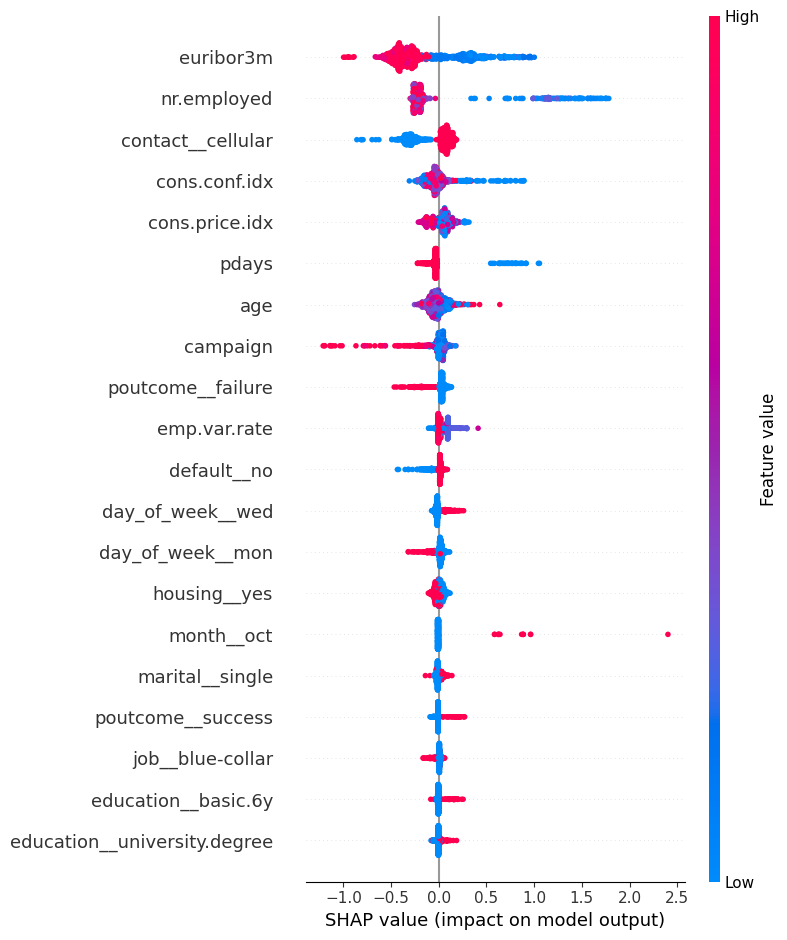

In [95]:
# Write here the code to visualise summary plot
shap.summary_plot(shap_values, features=observations, feature_names=all_features)

That's better than the built-in feature importance on RandomForest because not only we can see what features are important but also how they affect our predictions.

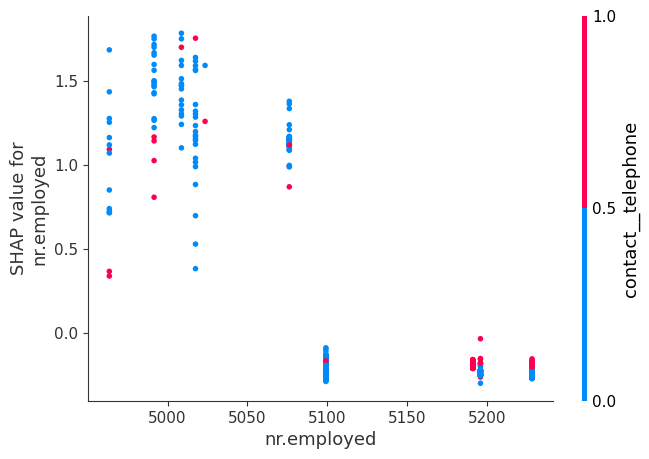

In [96]:
# Write here the code to visualise the dependance plot for "nr.employed"
shap.dependence_plot("nr.employed", shap_values, 
                     pd.DataFrame(observations, columns=all_features))